In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.
# Lightly adapted from https://github.com/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb

# Automatically generating object masks with SAM

Since SAM 2 can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image.

The class `SAM2AutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/automatic_mask_generator_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `SAM 2` in your environment using the installation instructions in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [1]:
using_colab = False

In [2]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/cars.jpg

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up

In [3]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [4]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [5]:
np.random.seed(3)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

## Example image

In [6]:
image = Image.open('../../50_dataset/bf/500.png')
print(f"Image mode after open: {image.mode}")  # Confirm I;16

# Scale the 16-bit grayscale to 8-bit grayscale (0-255)
image = image.point(lambda x: x/256)  # Scale 0-65535 to 0-255

# Convert to RGB (still grayscale, but in 3 channels)
image = image.convert("RGB")
print(f"Image mode after RGB conversion: {image.mode}")
image.show()

image = np.array(image)
print(f"Image array shape after RGB conversion: {image.shape}")

Image mode after open: I;16
Image mode after RGB conversion: RGB
Image array shape after RGB conversion: (2048, 2048, 3)


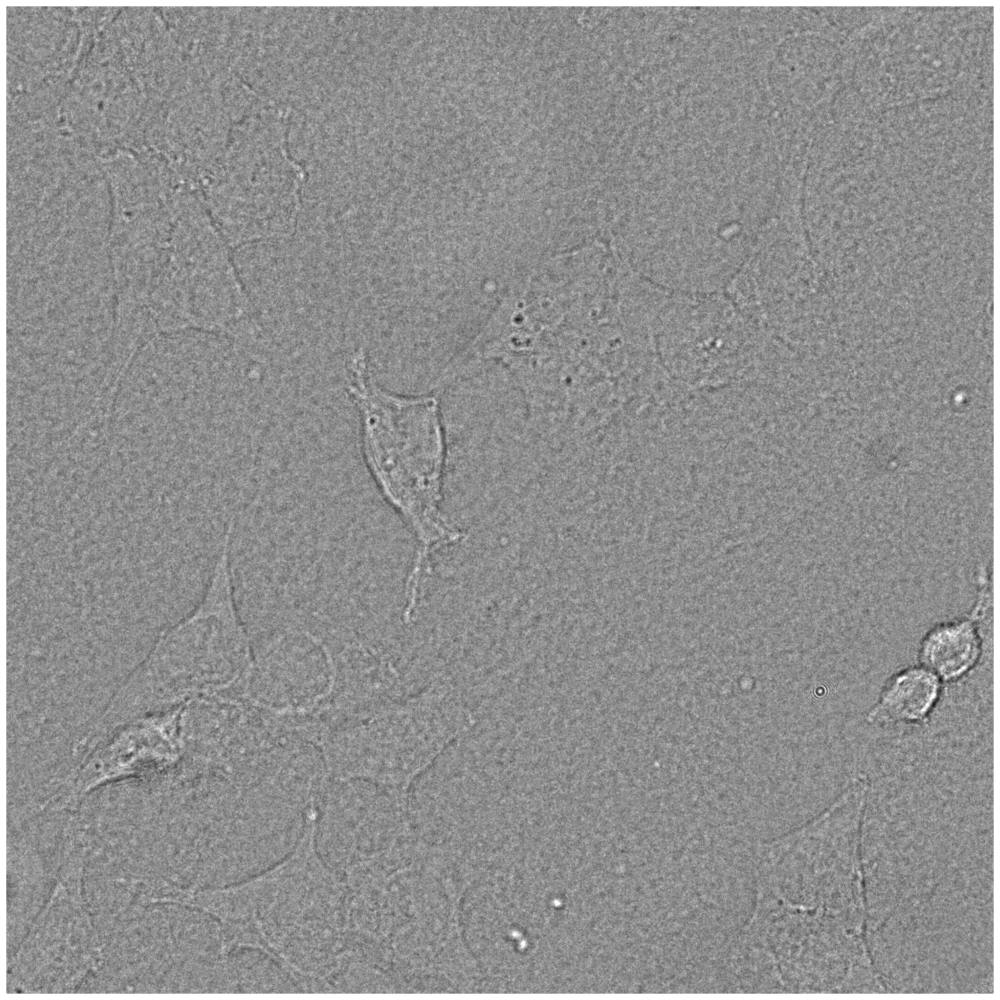

In [7]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()

## Automatic mask generation

To run automatic mask generation, provide a version of SAM 2 to the `SAM2AutomaticMaskGenerator` class. Set the path below to the SAM 2 checkpoint.

In [8]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(sam2)

To generate masks, just run `generate` on an image.

In [21]:
masks = mask_generator.generate(image)

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [22]:
print(len(masks))
print(masks[0].keys())

11
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


In [ ]:
import os
import cv2
import numpy as np
from typing import List, Dict, Any, Tuple

def calculate_segmentation_metrics(generated_masks: List[Dict[str, Any]],
                                   ground_truth_dir: str,
                                   epsilon: float = 1e-8) -> Dict[str, float]:
    """
    Calculates average IoU, Precision, Recall, and F2-Score between
    generated masks and ground truth binary masks stored in a directory.

    Assumes a positional correspondence: the i-th mask in `generated_masks`
    is compared against the i-th alphabetically sorted '.png' file in `ground_truth_dir`.
    Comparison stops at the length of the shorter list (generated masks or files).

    Args:
        generated_masks: A list of dictionaries, where each dictionary
                         represents a mask and contains at least the key
                         'segmentation' holding a boolean NumPy array.
        ground_truth_dir: The path to the directory containing the ground truth
                          binary masks as '.png' files. Files should be named
                          to sort alphabetically in the desired comparison order.
        epsilon: A small value added to denominators to prevent division by zero.

    Returns:
        A dictionary containing the average metrics across all successfully
        compared mask pairs:
        {
            'iou': average Intersection over Union,
            'precision': average Precision,
            'recall': average Recall,
            'f2_score': average F2-Score
        }
        Returns a dictionary with 0.0 values if no masks could be compared.
    """
    # Input validation
    if not isinstance(generated_masks, list):
        raise TypeError("`generated_masks` must be a list.")
    if not os.path.isdir(ground_truth_dir):
        print(f"Error: Ground truth directory not found: {ground_truth_dir}")
        return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    # Get and sort ground truth mask files
    try:
        gt_mask_files = sorted([
            f for f in os.listdir(ground_truth_dir)
            if f.lower().endswith('.png')
        ])
    except OSError as e:
        print(f"Error listing directory {ground_truth_dir}: {e}")
        return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    if not gt_mask_files:
        print(f"Warning: No '.png' mask files found in {ground_truth_dir}")
        return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    total_iou = 0.0
    total_precision = 0.0
    total_recall = 0.0
    total_f2 = 0.0
    compared_count = 0
    num_gen_masks = len(generated_masks)
    num_gt_masks = len(gt_mask_files)

    num_to_compare = min(num_gen_masks, num_gt_masks)

    if num_gen_masks != num_gt_masks:
        print(f"Warning: Number of generated masks ({num_gen_masks}) differs from "
              f"number of ground truth files ({num_gt_masks}). "
              f"Comparing the first {num_to_compare} pairs based on list/file order.")

    if num_to_compare == 0:
         print("Warning: No masks to compare.")
         return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    for i in range(num_to_compare):
        gen_mask_dict = generated_masks[i]
        gt_mask_filename = gt_mask_files[i]

        # --- 1. Get Generated Mask ---
        if 'segmentation' not in gen_mask_dict:
             print(f"Skipping generated mask index {i}: missing 'segmentation' key.")
             continue
        gen_mask = gen_mask_dict['segmentation']

        if not isinstance(gen_mask, np.ndarray) or gen_mask.dtype != bool:
            print(f"Warning: Generated mask at index {i} is not a boolean numpy array. Attempting conversion.")
            try:
                gen_mask = np.asarray(gen_mask, dtype=bool)
            except Exception as e:
                print(f"  Error converting generated mask {i} to boolean array: {e}. Skipping.")
                continue

        # --- 2. Load Ground Truth Mask ---
        gt_mask_path = os.path.join(ground_truth_dir, gt_mask_filename)
        try:
            gt_mask_cv = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)
            if gt_mask_cv is None:
                print(f"Warning: Failed to load ground truth mask: {gt_mask_path}. Skipping pair {i}.")
                continue
            # Convert to boolean (True for foreground pixels)
            gt_mask_bool = gt_mask_cv > 0 # Adjust threshold if needed (e.g., > 127)
        except Exception as e:
            print(f"Error reading or processing ground truth mask {gt_mask_path}: {e}. Skipping pair {i}.")
            continue

        # --- 3. Check Shapes ---
        if gt_mask_bool.shape != gen_mask.shape:
            print(f"Skipping mask pair {i} ('{gt_mask_filename}') due to shape mismatch: "
                  f"Generated {gen_mask.shape}, Ground Truth {gt_mask_bool.shape}")
            continue

        # --- 4. Calculate TP, FP, FN ---
        # True Positives (Intersection)
        intersection = np.logical_and(gen_mask, gt_mask_bool)
        tp = np.sum(intersection)

        # False Positives (Predicted mask \ Ground Truth)
        fp = np.sum(np.logical_and(gen_mask, np.logical_not(gt_mask_bool)))
        # Alternative FP: fp = np.sum(gen_mask) - tp

        # False Negatives (Ground Truth \ Predicted mask)
        fn = np.sum(np.logical_and(np.logical_not(gen_mask), gt_mask_bool))
        # Alternative FN: fn = np.sum(gt_mask_bool) - tp

        # --- 5. Calculate Metrics for this pair ---
        # IoU (Jaccard Index)
        union = tp + fp + fn
        iou = (tp + epsilon) / (union + epsilon)

        # Precision
        precision = (tp + epsilon) / (tp + fp + epsilon)

        # Recall (Sensitivity)
        recall = (tp + epsilon) / (tp + fn + epsilon)

        # F2-Score (weights recall higher)
        # F_beta = (1 + beta^2) * P * R / ((beta^2 * P) + R)
        # F2 = (1 + 4) * P * R / ((4 * P) + R) = 5 * P * R / (4 * P + R)
        f2_denominator = (4 * precision) + recall
        f2_score = (5 * precision * recall + epsilon) / (f2_denominator + epsilon)

        # --- 6. Accumulate Totals ---
        total_iou += iou
        total_precision += precision
        total_recall += recall
        total_f2 += f2_score
        compared_count += 1

    # --- 7. Calculate Average Metrics ---
    if compared_count > 0:
        average_iou = total_iou / compared_count
        average_precision = total_precision / compared_count
        average_recall = total_recall / compared_count
        average_f2 = total_f2 / compared_count
    else:
        average_iou = 0.0
        average_precision = 0.0
        average_recall = 0.0
        average_f2 = 0.0
        print("No mask pairs were successfully compared.")


    if compared_count > 0 and compared_count < num_to_compare:
         print(f"Warning: Only {compared_count} out of {num_to_compare} potential pairs "
               f"were successfully compared due to errors.")

    return {
        'iou': average_iou,
        'precision': average_precision,
        'recall': average_recall,
        'f2_score': average_f2
    }

Show all the masks overlayed on the image.

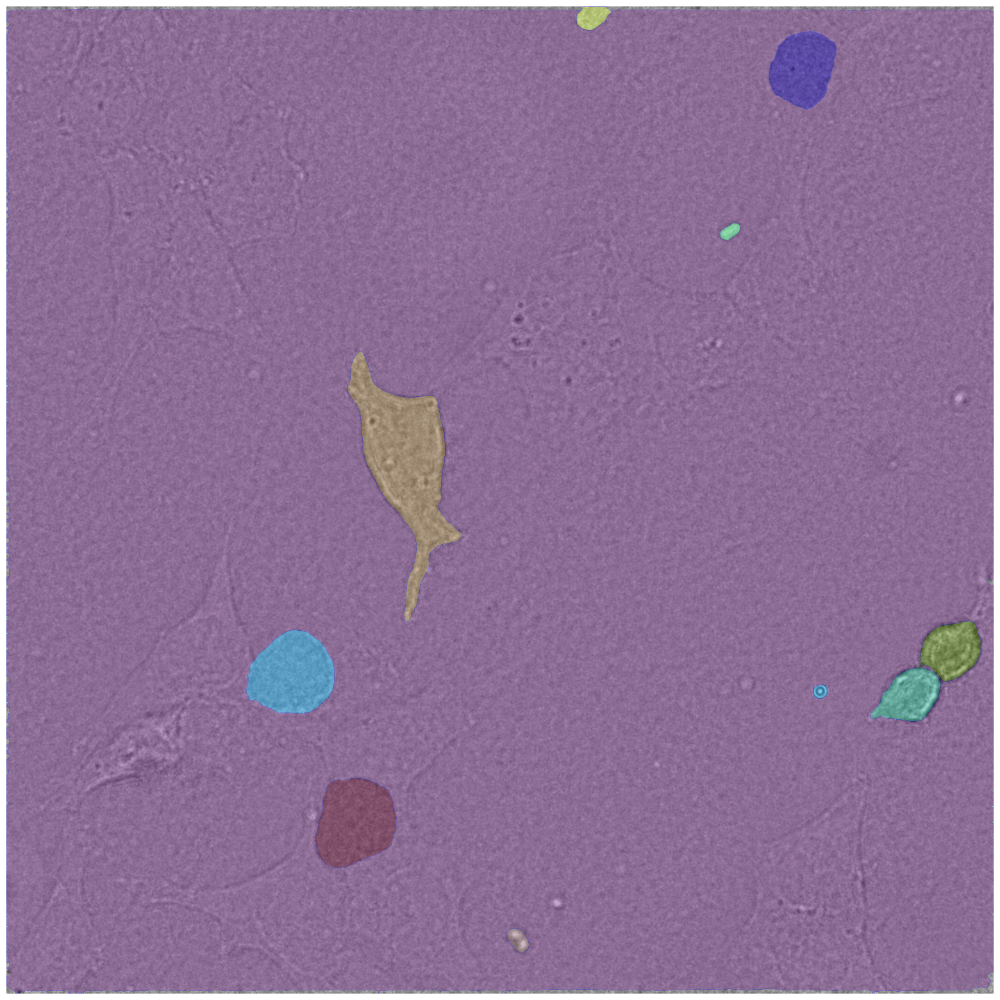

In [23]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [24]:
# Calculate accuracy of the generated masks against the binary masks
# which is a directory of multiple binary mask images

import os
import cv2


def calculate_accuracy(masks, binary_masks_dir):
    # Get the list of binary mask files
    binary_mask_files = [f for f in os.listdir(binary_masks_dir) if f.endswith('.png')]

    # Initialize variables to store accuracy metrics
    total_accuracy = 0
    num_masks = len(masks)

    for i, mask in enumerate(masks):
        # Load the corresponding binary mask
        binary_mask_path = os.path.join(binary_masks_dir, binary_mask_files[i])
        binary_mask = cv2.imread(binary_mask_path, cv2.IMREAD_GRAYSCALE)

        # Ensure the binary mask is in the same shape as the generated mask
        if binary_mask.shape != mask['segmentation'].shape:
            print(f"Skipping mask {i} due to shape mismatch.")
            continue

        # Calculate accuracy
        intersection = np.logical_and(mask['segmentation'], binary_mask)
        union = np.logical_or(mask['segmentation'], binary_mask)
        accuracy = np.sum(intersection) / np.sum(union)

        total_accuracy += accuracy

    average_accuracy = total_accuracy / num_masks if num_masks > 0 else 0
    return average_accuracy


# Example usage
binary_masks_dir = '../../50_dataset/binary_masks/500'  # Directory containing binary masks
accuracy = calculate_accuracy(masks, binary_masks_dir)
print(accuracy)

0.0026267413522129903


In [ ]:
calculate_segmentation_metrics(masks, '../../50_dataset/binary_masks/500')

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [13]:
mask_generator_2 = SAM2AutomaticMaskGenerator(
    model=sam2,
    points_per_side=64,
    points_per_batch=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.92,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=25.0,
    use_m2m=True,
)

In [44]:
mask_generator_2 = SAM2AutomaticMaskGenerator(
    model=sam2,

    # --- Sampling Density & Strategy ---
    points_per_side=64,          # Keep high: Need dense points to find faint objects.
    points_per_batch=128,        # Keep: Fine, relates to GPU memory/speed.
    crop_n_layers=1,             # Keep (or even try 2): Essential for low contrast & potentially small features. Cropping helps focus.
    crop_n_points_downscale_factor=1, # Changed from 2: Use full point density within crops for better detail on faint objects, accept speed trade-off.

    # --- Quality/Filtering Thresholds (Key Tuning Parameters) ---
    pred_iou_thresh=0.90,        # Increased from 0.7: Let's be slightly more selective initially. Low contrast might make SAM less confident, so start lower than default (0.86) but higher than your previous 0.7. *Adjust this down if cells are missed.*
    stability_score_thresh=0.90, # Decreased from 0.92: Lowering slightly as perfect stability might be hard with faint edges. Try to capture less 'stable' but real objects. *Adjust this up/down based on noise vs. missed cells.*
    stability_score_offset=1.0,  # Reset to default: Less critical to tune initially.

    # --- Postprocessing ---
    box_nms_thresh=0.7,          # Keep: Standard value for removing highly redundant duplicates.
    min_mask_region_area=100,    # Increased significantly from 25: Crucial for ignoring noise/debris. Estimate the pixel area of the smallest *real* cell you care about and set slightly below that. 100 is a guess - **adjust based on your image resolution and cell size.**

    # --- Model Features ---
    use_m2m=True                 # Keep: Usually improves mask quality.
)

In [45]:
masks2 = mask_generator_2.generate(image)

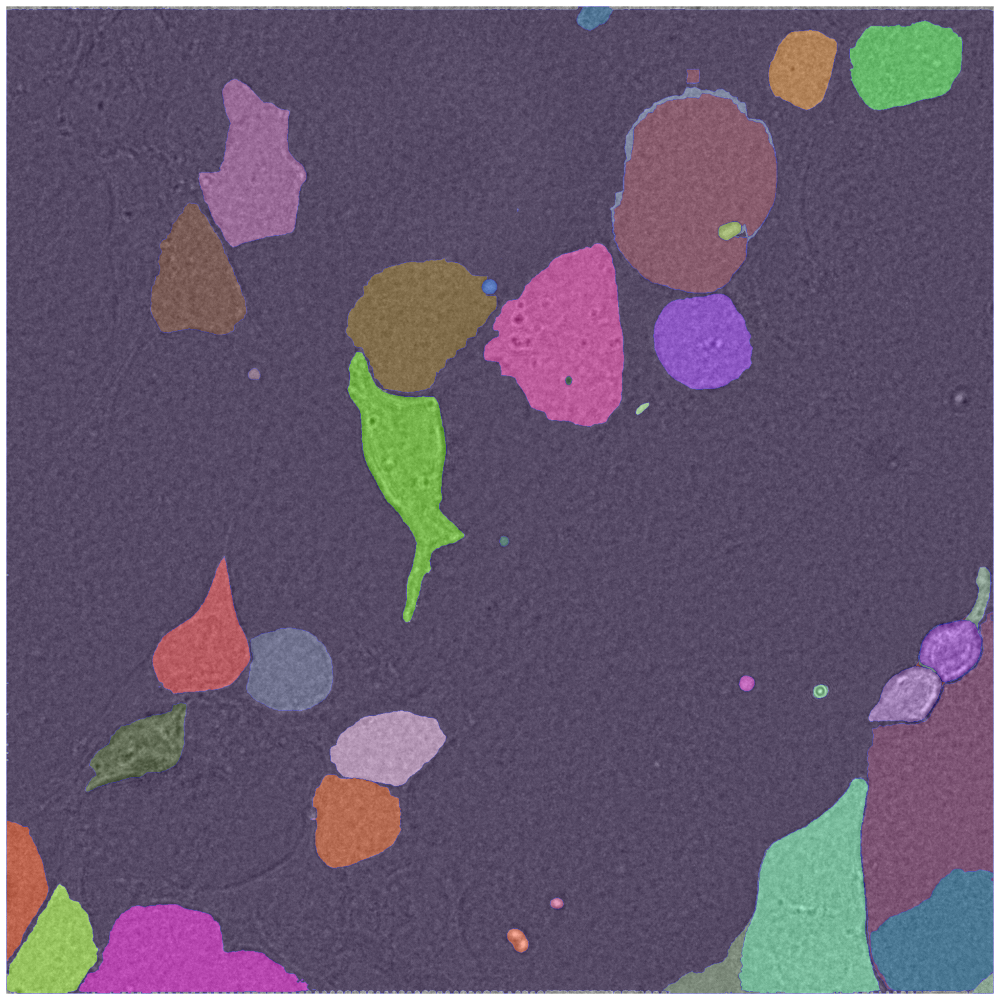

In [46]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show() 

In [48]:
import os
import cv2
import numpy as np
from typing import List, Dict, Any, Tuple

def calculate_segmentation_metrics(generated_masks: List[Dict[str, Any]],
                                   ground_truth_dir: str,
                                   epsilon: float = 1e-8) -> Dict[str, float]:
    """
    Calculates average IoU, Precision, Recall, and F2-Score between
    generated masks and ground truth binary masks stored in a directory.

    Assumes a positional correspondence: the i-th mask in `generated_masks`
    is compared against the i-th alphabetically sorted '.png' file in `ground_truth_dir`.
    Comparison stops at the length of the shorter list (generated masks or files).

    Args:
        generated_masks: A list of dictionaries, where each dictionary
                         represents a mask and contains at least the key
                         'segmentation' holding a boolean NumPy array.
        ground_truth_dir: The path to the directory containing the ground truth
                          binary masks as '.png' files. Files should be named
                          to sort alphabetically in the desired comparison order.
        epsilon: A small value added to denominators to prevent division by zero.

    Returns:
        A dictionary containing the average metrics across all successfully
        compared mask pairs:
        {
            'iou': average Intersection over Union,
            'precision': average Precision,
            'recall': average Recall,
            'f2_score': average F2-Score
        }
        Returns a dictionary with 0.0 values if no masks could be compared.
    """
    # Input validation
    if not isinstance(generated_masks, list):
        raise TypeError("`generated_masks` must be a list.")
    if not os.path.isdir(ground_truth_dir):
        print(f"Error: Ground truth directory not found: {ground_truth_dir}")
        return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    # Get and sort ground truth mask files
    try:
        gt_mask_files = sorted([
            f for f in os.listdir(ground_truth_dir)
            if f.lower().endswith('.png')
        ])
    except OSError as e:
        print(f"Error listing directory {ground_truth_dir}: {e}")
        return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    if not gt_mask_files:
        print(f"Warning: No '.png' mask files found in {ground_truth_dir}")
        return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    total_iou = 0.0
    total_precision = 0.0
    total_recall = 0.0
    total_f2 = 0.0
    compared_count = 0
    num_gen_masks = len(generated_masks)
    num_gt_masks = len(gt_mask_files)

    num_to_compare = min(num_gen_masks, num_gt_masks)

    if num_gen_masks != num_gt_masks:
        print(f"Warning: Number of generated masks ({num_gen_masks}) differs from "
              f"number of ground truth files ({num_gt_masks}). "
              f"Comparing the first {num_to_compare} pairs based on list/file order.")

    if num_to_compare == 0:
         print("Warning: No masks to compare.")
         return {'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f2_score': 0.0}

    for i in range(num_to_compare):
        gen_mask_dict = generated_masks[i]
        gt_mask_filename = gt_mask_files[i]

        # --- 1. Get Generated Mask ---
        if 'segmentation' not in gen_mask_dict:
             print(f"Skipping generated mask index {i}: missing 'segmentation' key.")
             continue
        gen_mask = gen_mask_dict['segmentation']

        if not isinstance(gen_mask, np.ndarray) or gen_mask.dtype != bool:
            print(f"Warning: Generated mask at index {i} is not a boolean numpy array. Attempting conversion.")
            try:
                gen_mask = np.asarray(gen_mask, dtype=bool)
            except Exception as e:
                print(f"  Error converting generated mask {i} to boolean array: {e}. Skipping.")
                continue

        # --- 2. Load Ground Truth Mask ---
        gt_mask_path = os.path.join(ground_truth_dir, gt_mask_filename)
        try:
            gt_mask_cv = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)
            if gt_mask_cv is None:
                print(f"Warning: Failed to load ground truth mask: {gt_mask_path}. Skipping pair {i}.")
                continue
            # Convert to boolean (True for foreground pixels)
            gt_mask_bool = gt_mask_cv > 0 # Adjust threshold if needed (e.g., > 127)
        except Exception as e:
            print(f"Error reading or processing ground truth mask {gt_mask_path}: {e}. Skipping pair {i}.")
            continue

        # --- 3. Check Shapes ---
        if gt_mask_bool.shape != gen_mask.shape:
            print(f"Skipping mask pair {i} ('{gt_mask_filename}') due to shape mismatch: "
                  f"Generated {gen_mask.shape}, Ground Truth {gt_mask_bool.shape}")
            continue

        # --- 4. Calculate TP, FP, FN ---
        # True Positives (Intersection)
        intersection = np.logical_and(gen_mask, gt_mask_bool)
        tp = np.sum(intersection)

        # False Positives (Predicted mask \ Ground Truth)
        fp = np.sum(np.logical_and(gen_mask, np.logical_not(gt_mask_bool)))
        # Alternative FP: fp = np.sum(gen_mask) - tp

        # False Negatives (Ground Truth \ Predicted mask)
        fn = np.sum(np.logical_and(np.logical_not(gen_mask), gt_mask_bool))
        # Alternative FN: fn = np.sum(gt_mask_bool) - tp

        # --- 5. Calculate Metrics for this pair ---
        # IoU (Jaccard Index)
        union = tp + fp + fn
        iou = (tp + epsilon) / (union + epsilon)

        # Precision
        precision = (tp + epsilon) / (tp + fp + epsilon)

        # Recall (Sensitivity)
        recall = (tp + epsilon) / (tp + fn + epsilon)

        # F2-Score (weights recall higher)
        # F_beta = (1 + beta^2) * P * R / ((beta^2 * P) + R)
        # F2 = (1 + 4) * P * R / ((4 * P) + R) = 5 * P * R / (4 * P + R)
        f2_denominator = (4 * precision) + recall
        f2_score = (5 * precision * recall + epsilon) / (f2_denominator + epsilon)

        # --- 6. Accumulate Totals ---
        total_iou += iou
        total_precision += precision
        total_recall += recall
        total_f2 += f2_score
        compared_count += 1

    # --- 7. Calculate Average Metrics ---
    if compared_count > 0:
        average_iou = total_iou / compared_count
        average_precision = total_precision / compared_count
        average_recall = total_recall / compared_count
        average_f2 = total_f2 / compared_count
    else:
        average_iou = 0.0
        average_precision = 0.0
        average_recall = 0.0
        average_f2 = 0.0
        print("No mask pairs were successfully compared.")


    if compared_count > 0 and compared_count < num_to_compare:
         print(f"Warning: Only {compared_count} out of {num_to_compare} potential pairs "
               f"were successfully compared due to errors.")

    return {
        'iou': average_iou,
        'precision': average_precision,
        'recall': average_recall,
        'f2_score': average_f2
    }

In [49]:
calculate_segmentation_metrics(masks2, '../../50_dataset/binary_masks/500')

{'iou': 0.03045813427191517,
 'precision': 0.03567517727142149,
 'recall': 0.07950481148327068,
 'f2_score': 0.8773533679419748}

In [32]:
import numpy as np
from PIL import Image
import os
import glob
from typing import List, Dict, Any, Tuple, Optional

# Small value to avoid division by zero
EPSILON = 1e-6

def calculate_segmentation_metrics(
    masks_list: List[Dict[str, Any]],
    gt_mask_dir: str
) -> Optional[Dict[str, float]]:
    """
    Calculates segmentation metrics (Precision, Recall, F2, IoU) by comparing
    a combined predicted mask derived from 'masks_list' against a combined
    ground truth mask derived from image files in 'gt_mask_dir'.

    Args:
        masks_list: A list of dictionaries, where each dictionary represents a
                    predicted object mask and contains at least a 'segmentation'
                    key with a 2D boolean NumPy array. It's assumed all these
                    arrays have the same shape.
        gt_mask_dir: The path to the directory containing individual ground
                     truth binary mask image files (e.g., PNG, TIF). It's assumed
                     these images have the same shape as the predicted masks.

    Returns:
        A dictionary containing the calculated metrics:
        {'precision': float, 'recall': float, 'f2_score': float, 'iou_score': float}
        Returns None if inputs are invalid (e.g., empty masks_list, directory
        not found, dimension mismatch).
    """

    if not masks_list:
        print("Error: The 'masks_list' is empty. Cannot determine mask dimensions.")
        return None

    # --- 1. Determine Dimensions and Initialize Combined Predicted Mask ---
    try:
        # Assume all masks in the list have the same shape
        mask_shape = masks_list[0]['segmentation'].shape
        if len(mask_shape) != 2:
             raise ValueError(f"Expected 2D boolean arrays in 'segmentation', got shape {mask_shape}")
        combined_pred_mask = np.zeros(mask_shape, dtype=bool)
        print(f"Determined mask shape from predictions: {mask_shape}")
    except (KeyError, IndexError, TypeError, ValueError) as e:
        print(f"Error accessing segmentation data in 'masks_list': {e}")
        return None

    # --- 2. Create Combined Predicted Mask ---
    for i, mask_info in enumerate(masks_list):
        try:
            individual_mask = mask_info['segmentation']
            if not isinstance(individual_mask, np.ndarray) or individual_mask.dtype != bool:
                 # If not boolean, attempt conversion (e.g., from int 0/1)
                 individual_mask = individual_mask.astype(bool)

            if individual_mask.shape != mask_shape:
                print(f"Error: Predicted mask at index {i} has shape {individual_mask.shape}, expected {mask_shape}.")
                return None
            # Combine using logical OR
            combined_pred_mask = np.logical_or(combined_pred_mask, individual_mask)
        except (KeyError, TypeError) as e:
            print(f"Warning: Skipping mask at index {i} due to missing 'segmentation' key or invalid data type: {e}")
            continue

    num_pred_pixels = np.sum(combined_pred_mask)
    print(f"Combined predicted mask created. Total predicted foreground pixels: {num_pred_pixels}")
    if num_pred_pixels == 0:
        print("Warning: Combined predicted mask is empty.")


    # --- 3. Create Combined Ground Truth Mask ---
    if not os.path.isdir(gt_mask_dir):
        print(f"Error: Ground truth directory not found: {gt_mask_dir}")
        return None

    combined_gt_mask = np.zeros(mask_shape, dtype=bool)
    gt_files_found = 0
    # Look for common image file extensions
    image_extensions = ["*.png", "*.tif", "*.tiff", "*.jpg", "*.jpeg", "*.bmp"]
    gt_mask_files = []
    for ext in image_extensions:
        gt_mask_files.extend(glob.glob(os.path.join(gt_mask_dir, ext)))

    if not gt_mask_files:
        print(f"Warning: No ground truth mask image files found in {gt_mask_dir}")
        # If no GT files, we can't calculate metrics meaningfully comparing to GT.
        # Depending on desired behavior, you might return zeros or None.
        # Let's assume this means the true mask is empty if no files are present.
        pass # combined_gt_mask remains all False

    else:
        print(f"Found {len(gt_mask_files)} potential ground truth mask files.")
        for f_path in gt_mask_files:
            try:
                gt_img = Image.open(f_path).convert('L') # Convert to grayscale
                gt_array = np.array(gt_img)

                if gt_array.shape != mask_shape:
                    print(f"Error: Ground truth mask file '{os.path.basename(f_path)}' has shape {gt_array.shape}, expected {mask_shape}.")
                    # Optional: Add resizing logic here if desired
                    # gt_img_resized = gt_img.resize(mask_shape[::-1], Image.NEAREST) # PIL resize uses (width, height)
                    # gt_array = np.array(gt_img_resized)
                    # print(f"Resized '{os.path.basename(f_path)}' to {mask_shape}")
                    return None # Strict check: stop if dimensions mismatch

                # Create boolean mask (True for non-zero pixels)
                individual_gt_mask = gt_array > 0
                # Combine using logical OR
                combined_gt_mask = np.logical_or(combined_gt_mask, individual_gt_mask)
                gt_files_found += 1
            except Exception as e:
                print(f"Warning: Could not load or process file '{os.path.basename(f_path)}': {e}")
                continue

    num_gt_pixels = np.sum(combined_gt_mask)
    print(f"Combined ground truth mask created from {gt_files_found} files. Total GT foreground pixels: {num_gt_pixels}")

    # --- 4. Calculate Metrics ---
    TP = np.sum(combined_pred_mask & combined_gt_mask)
    FP = np.sum(combined_pred_mask & ~combined_gt_mask)
    FN = np.sum(~combined_pred_mask & combined_gt_mask)

    print(f"\nCalculating Metrics:")
    print(f"True Positives (TP): {TP}")
    print(f"False Positives (FP): {FP}")
    print(f"False Negatives (FN): {FN}")

    # Calculate metrics, adding epsilon for numerical stability
    precision = TP / (TP + FP + EPSILON)
    recall = TP / (TP + FN + EPSILON)
    f2_score = (1 + 2**2) * (precision * recall) / ((2**2 * precision) + recall + EPSILON) if (precision + recall) > 0 else 0.0
    iou_score = TP / (TP + FP + FN + EPSILON)

    metrics = {
        'precision': precision,
        'recall': recall,
        'f2_score': f2_score,
        'iou_score': iou_score,
        'TP': float(TP), # Store counts as well if needed
        'FP': float(FP),
        'FN': float(FN)
    }

    print("\n--- Evaluation Metrics ---")
    print(f"Precision: {metrics['precision']:.4f}")
    print(f"Recall:    {metrics['recall']:.4f}")
    print(f"F2 Score:  {metrics['f2_score']:.4f}")
    print(f"IoU Score: {metrics['iou_score']:.4f}")

    return metrics


In [36]:
gt_directory = '../../50_dataset/binary_masks/500'
metrics = calculate_segmentation_metrics(masks2, gt_directory)

if metrics:
    print("Calculated Metrics:")
    print(metrics)

Determined mask shape from predictions: (2048, 2048)
Combined predicted mask created. Total predicted foreground pixels: 4179406
Found 25 potential ground truth mask files.
Combined ground truth mask created from 25 files. Total GT foreground pixels: 1178254

Calculating Metrics:
True Positives (TP): 1175459
False Positives (FP): 3003947
False Negatives (FN): 2795

--- Evaluation Metrics ---
Precision: 0.2813
Recall:    0.9976
F2 Score:  0.6609
IoU Score: 0.2811
Calculated Metrics:
{'precision': 0.281250254222662, 'recall': 0.9976278459474802, 'f2_score': 0.6609326717875652, 'iou_score': 0.28106229231921637, 'TP': 1175459.0, 'FP': 3003947.0, 'FN': 2795.0}


In [37]:
gt_directory = '../../50_dataset/binary_masks/500'
metrics = calculate_segmentation_metrics(masks, gt_directory)

if metrics:
    print("Calculated Metrics:")
    print(metrics)

Determined mask shape from predictions: (2048, 2048)
Combined predicted mask created. Total predicted foreground pixels: 4166871
Found 25 potential ground truth mask files.
Combined ground truth mask created from 25 files. Total GT foreground pixels: 1178254

Calculating Metrics:
True Positives (TP): 1171819
False Positives (FP): 2995052
False Negatives (FN): 6435

--- Evaluation Metrics ---
Precision: 0.2812
Recall:    0.9945
F2 Score:  0.6598
IoU Score: 0.2808
Calculated Metrics:
{'precision': 0.28122276883534886, 'recall': 0.9945385290429783, 'f2_score': 0.6598160804895552, 'iou_score': 0.28078913935372085, 'TP': 1171819.0, 'FP': 2995052.0, 'FN': 6435.0}


In [73]:
import numpy as np
import torch
import cv2
import os
import glob # Import glob for easier file matching
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import time # Optional: for timing steps

# --- Configuration ---
dataset_root = "../../50_dataset/" # Path to the root of your dataset
image_subdir = "bf"          # Subdirectory containing images
mask_subdir = "binary_masks"         # Subdirectory containing mask directories
image_extension = ".png"     # Extension of your image files
mask_extension = ".png"      # Extension of your mask files

# --- 1. Gather Data ---
print("Scanning dataset...")
data = []
image_dir = os.path.join(dataset_root, image_subdir)
print(f"Image directory: {image_dir}")
mask_root_dir = os.path.join(dataset_root, mask_subdir)
print(f"Mask root directory: {mask_root_dir}")

# Iterate through images in the image directory
for image_filename in os.listdir(image_dir):
    if image_filename.endswith(image_extension):
        image_path = os.path.join(image_dir, image_filename)
        # Construct the corresponding mask directory path
        # Assumes mask directory name is the image filename without extension
        mask_dir_name = os.path.splitext(image_filename)[0]
        mask_dir_path = os.path.join(mask_root_dir, mask_dir_name)

        # Check if the corresponding mask directory exists and is a directory
        if os.path.isdir(mask_dir_path):
            # Check if there are any mask files inside
            mask_files = os.listdir(mask_dir_path)
            mask_files = [f for f in mask_files if f.endswith(mask_extension)]
            if mask_files: # Only add if mask directory exists and is not empty
                data.append({"image": image_path, "mask_dir": mask_dir_path})
            else:
                print(f"Warning: Mask directory exists but is empty: {mask_dir_path}")
        # else:
            # print(f"Warning: No corresponding mask directory found for {image_filename} at {mask_dir_path}")


if not data:
    raise ValueError(f"No valid image/mask pairs found in {dataset_root}. Check paths and structure.")

print(f"Found {len(data)} image/mask pairs.")

# --- 2. Modified read_batch Function ---
def read_batch(data):
    """
    Reads a random image and all its corresponding binary mask files.
    Generates a random point prompt for each valid mask.
    """
    if not data:
        return None, None, None, None # Handle empty data list case

    # Select a random image entry
    entry = data[np.random.randint(len(data))]

    image_path = entry["image"]
    mask_dir = entry["mask_dir"]

    # Read image
    try:
        Img = cv2.imread(image_path)
        if Img is None:
            print(f"Warning: Failed to read image {image_path}. Skipping.")
            return None, None, None, None
        Img = Img[..., ::-1] # Convert BGR to RGB
    except Exception as e:
        print(f"Error reading image {image_path}: {e}. Skipping.")
        return None, None, None, None

    orig_h, orig_w = Img.shape[:2]

    # Resize image (same logic as before)
    r = np.min([1024 / orig_w, 1024 / orig_h]) # scaling factor
    new_w, new_h = int(orig_w * r), int(orig_h * r)
    Img = cv2.resize(Img, (new_w, new_h))

    masks = []
    points = []

    # Find and process all mask files in the directory
    mask_files = glob.glob(os.path.join(mask_dir, f"*{mask_extension}"))

    if not mask_files:
         print(f"Warning: No mask files ({mask_extension}) found in {mask_dir} for image {image_path}. Skipping.")
         return None, None, None, None # No masks for this image

    for mask_file in mask_files:
        try:
            # Read mask as grayscale
            mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)
            if mask is None:
                print(f"Warning: Failed to read mask {mask_file}. Skipping this mask.")
                continue

            # Resize mask using nearest neighbor interpolation
            mask = cv2.resize(mask, (new_w, new_h), interpolation=cv2.INTER_NEAREST)

            # Ensure mask is binary (0 or 1)
            mask = (mask > 127).astype(np.uint8) # Threshold and convert to uint8 {0, 1}

            # Check if mask is empty after resizing/thresholding
            if mask.sum() == 0:
                # print(f"Warning: Mask {mask_file} is empty after processing. Skipping.")
                continue

            # Get coordinates of non-zero pixels
            coords = np.argwhere(mask > 0)
            if len(coords) == 0: # Should be redundant due to mask.sum() check, but safe
                 continue

            # Choose a random point within the mask
            yx = coords[np.random.randint(len(coords))] # Random (y, x) coordinate

            # Append mask and point (SAM expects [x, y] format for points)
            masks.append(mask)
            points.append([[yx[1], yx[0]]]) # Note the order change: [x, y]

        except Exception as e:
            print(f"Error processing mask {mask_file}: {e}. Skipping this mask.")
            continue

    # If no valid masks were found/processed for this image
    if not masks:
        # print(f"Warning: No valid masks processed for image {image_path}. Skipping batch.")
        return None, None, None, None # Indicate an empty batch

    # Convert lists to numpy arrays
    masks_np = np.array(masks)
    points_np = np.array(points)
    labels_np = np.ones([len(masks), 1], dtype=np.int64) # Labels are 1 for positive points

    return Img, masks_np, points_np, labels_np

# --- Load Model ---
print("Loading SAM2 model...")
# sam2_checkpoint = "sam2_hiera_small.pt" # Make sure this path is correct
# Use a full path if necessary, e.g., /path/to/your/weights/sam2_hiera_small.pt
sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt" # Example using tiny model
model_cfg = "../sam2/configs/sam2.1/sam2.1_hiera_l.yaml"         # Example using tiny config
# sam2_checkpoint = "sam2_hiera_small.pt"
# model_cfg = "sam2_hiera_s.yaml" # Corresponding config for small model

if not os.path.exists(sam2_checkpoint):
    raise FileNotFoundError(f"SAM2 checkpoint not found at: {sam2_checkpoint}")
if not os.path.exists(model_cfg):
     raise FileNotFoundError(f"SAM2 model config not found at: {model_cfg}")

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
predictor = SAM2ImagePredictor(sam2_model)
print("Model loaded.")

# --- Set Training Parameters ---
print("Setting up training...")
# Enable training for decoder and prompt encoder
predictor.model.sam_mask_decoder.train(True)
predictor.model.sam_prompt_encoder.train(True)

# Optional: Enable image encoder training (requires more GPU memory and code changes for no_grad)
# predictor.model.image_encoder.train(True)
# print("WARNING: Image encoder training enabled. Ensure 'no_grad' blocks are handled if needed.")

# Filter parameters that require gradients
params_to_optimize = [
    p for p in predictor.model.parameters() if p.requires_grad
]

# Check if there are parameters to optimize
if not params_to_optimize:
     raise ValueError("No parameters require gradients. Check model train() flags.")
else:
    print(f"Optimizing {len(params_to_optimize)} parameter tensors.")


optimizer = torch.optim.AdamW(params=params_to_optimize, lr=1e-5, weight_decay=4e-5)

# Use GradScaler only if using CUDA
scaler = torch.cuda.amp.GradScaler() if device == "cuda" else None
# --- Training Loop ---
print("Starting training loop...")
num_iterations = 100000
save_interval = 1000
mean_iou = 0.0 # Initialize mean IOU
batch_skip_count = 0

for itr in range(num_iterations):
    optimizer.zero_grad() # Move zero_grad here for clarity

    # --- Load Data Batch ---
    image, gt_masks_np, input_points_np, input_labels_np = read_batch(data)

    # Handle cases where read_batch returns None (e.g., file errors, no masks)
    if image is None or gt_masks_np is None or gt_masks_np.shape[0] == 0:
        batch_skip_count += 1
        if batch_skip_count > 100 and batch_skip_count % 100 == 0: # Avoid spamming logs
             print(f"Warning: Skipped {batch_skip_count} batches due to loading issues or empty masks.")
        if batch_skip_count > len(data) * 2: # Stop if consistently failing
             print("Error: Consistently failing to load valid batches. Check data integrity and paths.")
             break
        continue # Skip to next iteration

    batch_skip_count = 0 # Reset skip count on successful batch load

    # --- Mixed Precision Context ---
    # Use autocast only if using CUDA and scaler is available
    autocast_enabled = (device == "cuda" and scaler is not None)
    with torch.cuda.amp.autocast(enabled=autocast_enabled):
        # --- Image Encoding ---
        try:
            predictor.set_image(image) # Apply SAM image encoder
        except Exception as e:
            print(f"Error during predictor.set_image: {e}. Skipping batch {itr}.")
            torch.cuda.empty_cache() # Try to clear cache if OOM related
            continue


        # --- Prompt Encoding ---
        # Ensure points and labels are on the correct device
        # Note: _prep_prompts handles moving to device internally based on predictor's device
        # However, explicitly creating tensors might be needed depending on internal details.
        # Let's rely on _prep_prompts for now.
        try:
             mask_input, unnorm_coords, labels, unnorm_box = predictor._prep_prompts(
                input_points_np, input_labels_np, box=None, mask_logits=None, normalize_coords=True
             )
             sparse_embeddings, dense_embeddings = predictor.model.sam_prompt_encoder(
                points=(unnorm_coords, labels), boxes=None, masks=None,
             )
        except Exception as e:
             print(f"Error during prompt encoding: {e}. Skipping batch {itr}.")
             torch.cuda.empty_cache()
             continue


        # --- Mask Decoder ---
        try:
            batched_mode = unnorm_coords.shape[0] > 1 # multi object prediction
            # Ensure features are on the correct device (should be handled by predictor.set_image)
            # Accessing internal features like this can be brittle if SAM2 internals change.
            high_res_features = [feat_level[-1].unsqueeze(0) for feat_level in predictor._features["high_res_feats"]]
            image_embed = predictor._features["image_embed"][-1].unsqueeze(0)

            low_res_masks, prd_scores, _, _ = predictor.model.sam_mask_decoder(
                image_embeddings=image_embed,
                image_pe=predictor.model.sam_prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings=sparse_embeddings,
                dense_prompt_embeddings=dense_embeddings,
                multimask_output=True, # Usually True for SAM, produces multiple mask qualities
                repeat_image=batched_mode,
                high_res_features=high_res_features,
            )
            # Upscale the masks to the original image resolution -> uses input image size before predictor resize
            # predictor._orig_hw[-1] should contain the size of the image *after* predictor's internal resizing,
            # which matches the gt_masks_np dimensions.
            # Get the size of the image as it was passed to set_image
            # This should match the dimensions of gt_masks_tensor
            target_hw = predictor._orig_hw[0] if predictor._orig_hw else None
            if target_hw is None:
                print(f"Error: predictor.original_size is None after set_image. Skipping batch {itr}.")
                torch.cuda.empty_cache()
                continue # Skip this problematic batch

            # Upscale the low-resolution masks to the target size (which matches the GT mask size)
            prd_masks_logits = predictor._transforms.postprocess_masks(low_res_masks, target_hw)

        except Exception as e:
            print(f"Error during mask decoding: {e}. Skipping batch {itr}.")
            print(f"Shapes - image_embed: {image_embed.shape}, sparse: {sparse_embeddings.shape}, dense: {dense_embeddings.shape}")
            torch.cuda.empty_cache()
            continue


        # --- Loss Calculation ---
        # Move GT masks to device and ensure correct type
        gt_masks_tensor = torch.tensor(gt_masks_np.astype(np.float32)).to(device)

        # We typically use the highest quality mask output from multimask (index 0)
        # Apply sigmoid to convert logits to probabilities [0, 1]
        prd_masks_prob = torch.sigmoid(prd_masks_logits[:, 0]) # Shape: [num_masks, H, W]

        # Ensure shapes match - might need adjustment if multimask_output changes things
        if prd_masks_prob.shape != gt_masks_tensor.shape:
             print(f"Shape mismatch! Predicted: {prd_masks_prob.shape}, Ground Truth: {gt_masks_tensor.shape}. Skipping batch {itr}.")
             # This often happens if the number of predicted masks doesn't match GT.
             # Could be due to issues in prompt handling or decoder.
             torch.cuda.empty_cache()
             continue

        # Binary Cross Entropy Loss (Numerically stable version)
        bce_loss = torch.nn.functional.binary_cross_entropy_with_logits(
            prd_masks_logits[:, 0], gt_masks_tensor, reduction='mean'
        )
        # seg_loss = (-gt_masks_tensor * torch.log(prd_masks_prob + 1e-5) - (1 - gt_masks_tensor) * torch.log(1 - prd_masks_prob + 1e-5)).mean() # Original version

        # IOU Calculation for Score Loss (use probabilities > 0.5 for mask)
        prd_masks_binary = (prd_masks_prob > 0.5).float()
        intersection = (gt_masks_tensor * prd_masks_binary).sum(dim=(1, 2))
        union = gt_masks_tensor.sum(dim=(1, 2)) + prd_masks_binary.sum(dim=(1, 2)) - intersection
        iou = (intersection + 1e-5) / (union + 1e-5) # Add epsilon for stability

        # Score Loss (L1 distance between predicted score and calculated IoU)
        # Use the score corresponding to the mask we used (index 0)
        score_loss = torch.abs(prd_scores[:, 0] - iou).mean()

        # Combined Loss
        loss = bce_loss + score_loss * 0.05 # Using BCE loss now

    # --- Backpropagation ---
    try:
        if scaler: # If using CUDA and mixed precision
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else: # If using CPU or no mixed precision
            loss.backward()
            optimizer.step()

    except Exception as e:
        print(f"Error during backpropagation/optimizer step: {e}. Skipping batch {itr}.")
        torch.cuda.empty_cache() # Try to free memory
        continue


    # --- Logging and Saving ---
    if itr % 10 == 0: # Log more frequently initially
        iou_np = iou.cpu().detach().numpy()
        # Update mean IoU using exponential moving average
        mean_iou = 0.99 * mean_iou + 0.01 * np.mean(iou_np) if itr > 0 else np.mean(iou_np)
        print(f"Step: {itr}, Loss: {loss.item():.4f} (Seg: {bce_loss.item():.4f}, Score: {score_loss.item():.4f}), Batch IoU: {np.mean(iou_np):.4f}, Mean IoU: {mean_iou:.4f}")

    if itr > 0 and itr % save_interval == 0:
        save_path = f"sam2_finetuned_iter_{itr}.pt"
        try:
            torch.save(predictor.model.state_dict(), save_path)
            print(f"Model saved to {save_path}")
        except Exception as e:
            print(f"Error saving model: {e}")

# Final save
try:
    final_save_path = "sam2_finetuned_final.pt"
    torch.save(predictor.model.state_dict(), final_save_path)
    print(f"Final model saved to {final_save_path}")
except Exception as e:
    print(f"Error saving final model: {e}")

print("Training finished.")

Scanning dataset...
Image directory: ../../50_dataset/bf
Mask root directory: ../../50_dataset/binary_masks
Found 50 image/mask pairs.
Loading SAM2 model...
Using device: cuda
Model loaded.
Setting up training...
Optimizing 902 parameter tensors.
Starting training loop...


/var/tmp/ipykernel_2193735/850433060.py:187: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if device == "cuda" else None
/var/tmp/ipykernel_2193735/850433060.py:216: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=autocast_enabled):


Step: 0, Loss: 0.0806 (Seg: 0.0629, Score: 0.3541), Batch IoU: 0.4821, Mean IoU: 0.4821
Step: 10, Loss: 0.0653 (Seg: 0.0506, Score: 0.2937), Batch IoU: 0.4327, Mean IoU: 0.4816
Step: 20, Loss: 0.0567 (Seg: 0.0438, Score: 0.2579), Batch IoU: 0.4547, Mean IoU: 0.4813
Step: 30, Loss: 0.0853 (Seg: 0.0749, Score: 0.2072), Batch IoU: 0.3903, Mean IoU: 0.4804
Step: 40, Loss: 0.0742 (Seg: 0.0569, Score: 0.3459), Batch IoU: 0.4029, Mean IoU: 0.4796
Step: 50, Loss: 0.0573 (Seg: 0.0409, Score: 0.3278), Batch IoU: 0.4875, Mean IoU: 0.4797
Step: 60, Loss: 0.0612 (Seg: 0.0486, Score: 0.2515), Batch IoU: 0.4403, Mean IoU: 0.4793
Step: 70, Loss: 0.0576 (Seg: 0.0432, Score: 0.2886), Batch IoU: 0.5026, Mean IoU: 0.4795
Step: 80, Loss: 0.0530 (Seg: 0.0390, Score: 0.2807), Batch IoU: 0.4944, Mean IoU: 0.4797
Step: 90, Loss: 0.0525 (Seg: 0.0399, Score: 0.2516), Batch IoU: 0.5039, Mean IoU: 0.4799
Step: 100, Loss: 0.0687 (Seg: 0.0554, Score: 0.2653), Batch IoU: 0.4590, Mean IoU: 0.4797
Step: 110, Loss: 0.05

KeyboardInterrupt: 

In [ ]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(sam2)

In [76]:
torch.cuda.empty_cache()